In [1]:
import os
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings
warnings.simplefilter('ignore')

<img src="schema.png">

 - sample_submission:
    - 1) Id - id телефона
    - 2) Predicted - необходимо предсказать для сентября
 - train
    - 1) phone_id - id телефона клиента
    - 2) month - месяц
    - 3) target - 1, если отток, 0, если нет
 - addresses:
    - 1) id - ship_address_id - foreign key к shipments
    - 2) phone_id - foreign key к train и sample_submission
 - shipments:
    - 1) user_id - id клиента в системе
    - 2) **ship_address_id - foreign key к addresses**
    - 3) **shipment_id - foreign key к line_items**
    - 4) order_id - id заказа (в одной доставке может быть несколько заказов)
    - 5) order_created_at - дата начала оформления заказа
    - 6) order_completed_at - дата оформления заказа
    - 7) shipment_starts_at - дата начала слота доставки
    - 8) retailer - название ритейлера
    - 9) order_state - статус заказа
    - 10) shipment_state - статус доставки
    - 11) city_name - название города
    - 12) store_id - id конкретного магазина
    - 13) total_cost - фактические затраты на доставку с учетом промо на доставку
    - 14) rate - оценка заказа
    - 15) dw_kind - тип доставки
    - 16) promo_total - промо на товары
    - 17) total_weight - общий вес заказа
    - 18) platform - платформа
    - 19) os - операционная система
    - 20) shipped_at - дата доставки заказа
 - **left** shipments / **messages**:
    - 1) sent - дата коммуникации с клиентом в формате unix timestamp
    - 2) **action_id - foreign key к actions**
    - 3) user_id - foreign key к shipments и user_profiles
 - **left** shipments / **actions**:
    - 1) **id - foreign key к messages**
    - 2) subject - заголовок письма
    - 3) body - тело письма
    - 4) type - канал коммуникации
 - **rigth** shipments / **line_items**:
      - 1) **shipment_id - foreign key к shipments**
      - 2) **master_category_id - foreign key к master_categories**
      - 3) created_at - время добавления товара в корзину
      - 4) price - цена товара
      - 5) discount - скидка на товар
      - 6) item_id - id товара в корзине
      - 7) quantity - кол-во товара
      - 8) product_id - id товара
      - 9) brand_name - название бренда
      - 10) pricer - логика вычисления цены
      - 11) replaced - был ли товар заменен
      - 12) cancelled - был ли товар отменен
 - **rigth** shipments / **line_items** / **master_cotegories**:
      - 1) **id - id категории верхнего уровня, foreign key к line_items**
      - 2) name - название родительской категории
      - 3) parent_category_id - id родительской категории

In [2]:
train = pd.read_csv('train/train.csv')
addresses = pd.read_csv('misc/addresses.csv')
master_categories = pd.read_csv('misc/master_categories.csv')
user_profiles = pd.read_csv('misc/user_profiles.csv')

In [3]:
train_new = pd.merge(train,addresses,on=['phone_id'],how='left')

##### Объединим shipments

In [4]:
def concat_several(dir_name='./shipments'):
    li = []
    for filename in sorted(os.listdir(dir_name)):
        df = pd.read_csv(os.path.join(dir_name, filename))
        li.append(df)
    return pd.concat(li,axis=0)

In [5]:
shipments = concat_several()

In [6]:
def perform_date(df,cols):
    for col in cols:
        df[col] = pd.to_datetime(df[col])
    return df


In [7]:
date_cols_shipments = ['order_created_at','order_completed_at','shipment_starts_at','shipped_at']

In [8]:
shipments = perform_date(shipments,date_cols_shipments)

In [9]:
shipments[date_cols_shipments].describe()

,order_created_at,order_completed_at,shipment_starts_at,shipped_at
count,2260686,2260686,2260686,2075670
unique,2044439,2025311,7221,1864234
top,2020-03-04 14:24:13,2020-07-25 07:43:28,2020-05-29 12:00:00,2020-05-29 09:31:02
freq,7,9,1706,6
first,2014-04-24 13:42:42,2019-12-31 21:59:01,2020-01-02 09:00:00,2020-01-02 09:24:28
last,2020-08-31 23:49:06,2020-08-31 23:58:22,2020-10-16 18:00:00,2020-09-04 09:04:32


In [10]:
shipments.head()

,user_id,ship_address_id,shipment_id,order_id,order_created_at,order_completed_at,shipment_starts_at,retailer,s.order_state,shipment_state,s.city_name,s.store_id,total_cost,rate,dw_kind,promo_total,total_weight,platform,os,shipped_at
0,11019,171906,322307,2156687,2017-08-03 21:25:23,2020-02-18 14:07:00,2020-02-20 07:00:00,METRO,complete,shipped,Москва,21,168.0,0,courier,0.0,30170,web,windows,2020-02-20 08:08:54
1,62278,278832,387023,3021953,2018-03-02 17:22:04,2020-01-03 13:09:26,2020-01-03 17:00:00,METRO,complete,shipped,Москва,10,98.0,0,courier,-150.0,11305,web,windows,2020-01-03 18:10:40
2,905126,468407,388943,3018198,2018-02-28 11:32:47,2020-02-12 12:39:28,2020-02-13 11:00:00,METRO,complete,shipped,Москва,21,98.0,5,courier,0.0,13589,app,ios,2020-02-13 12:33:53
3,21412,61962,421048,3030227,2018-03-07 20:37:27,2020-01-25 11:58:56,2020-01-25 18:00:00,METRO,complete,shipped,Москва,8,158.0,0,courier,0.0,9726,web,mac,2020-01-25 19:55:32
4,42110,378297,442659,2923996,2017-12-24 11:19:04,2020-01-07 14:30:44,2020-01-07 19:00:00,METRO,complete,shipped,Москва,2,163.0,0,courier,0.0,30323,web,windows,2020-01-07 19:51:37


In [11]:
shipments['shipped_at_month'] = shipments['shipped_at'].apply(lambda x: x.month)
shipments['order_completed_at_month'] = shipments['order_completed_at'].apply(lambda x: x.month)

In [12]:
train_new['order_completed_at'] = pd.to_datetime(train_new['order_completed_at'])
train_new['order_completed_at_month'] = train_new['order_completed_at'].apply(lambda x: x.month)

In [13]:
train_all = pd.merge(train_new,shipments,left_on=['id','order_completed_at_month'],right_on=['ship_address_id','order_completed_at_month'],how='inner')

In [14]:
train_all.shape

(1552657, 26)

In [15]:
train_all.to_hdf('train_all.h5',key='df',mode='w')

In [16]:
train_all.isna().sum(axis=0)

phone_id                        0
order_completed_at_x            0
target                          0
id                              0
order_completed_at_month        0
user_id                         0
ship_address_id                 0
shipment_id                     0
order_id                        0
order_created_at                0
order_completed_at_y            0
shipment_starts_at              0
retailer                        0
s.order_state                   0
shipment_state                  4
s.city_name                     0
s.store_id                      0
total_cost                      0
rate                            0
dw_kind                         0
promo_total                     0
total_weight                    0
platform                       31
os                             31
shipped_at                  89407
shipped_at_month            89407
dtype: int64

### EDA

In [17]:
import pandas_profiling

In [18]:
train_all.head()

,phone_id,order_completed_at_x,target,id,order_completed_at_month,user_id,ship_address_id,shipment_id,order_id,order_created_at,...,s.store_id,total_cost,rate,dw_kind,promo_total,total_weight,platform,os,shipped_at,shipped_at_month
0,19843,2020-01-01,1.0,3064377,1,810074,3064377,2163606,5919719,2020-01-25 19:39:15,...,11,0.0,0,courier,-2000.0,2580,web,windows,NaT,NaN
1,19843,2020-02-01,0.0,3584090,2,975356,3584090,2497858,6465355,2020-02-21 11:00:13,...,87,98.0,0,courier,0.0,9710,web,windows,NaT,NaN
2,19843,2020-02-01,0.0,3584562,2,975356,3584562,2498210,6465852,2020-02-21 11:18:53,...,87,0.0,0,courier,-2000.0,9306,web,windows,2020-02-21 13:39:11,2.0
3,19843,2020-03-01,0.0,4617411,3,1254340,4617411,3289538,7505837,2020-03-27 15:37:18,...,100,98.0,0,courier,0.0,6150,web,mac,NaT,NaN
4,19843,2020-05-01,0.0,8050123,5,1999148,8050123,6163472,10999387,2020-05-29 13:33:12,...,257,98.0,0,courier,0.0,977,web,mac,NaT,NaN


In [19]:
pd.__version__

'1.1.3'

In [20]:
train_all.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1552657 entries, 0 to 1552656
Data columns (total 26 columns):
 #   Column                    Non-Null Count    Dtype         
---  ------                    --------------    -----         
 0   phone_id                  1552657 non-null  int64         
 1   order_completed_at_x      1552657 non-null  datetime64[ns]
 2   target                    1552657 non-null  float64       
 3   id                        1552657 non-null  int64         
 4   order_completed_at_month  1552657 non-null  int64         
 5   user_id                   1552657 non-null  int64         
 6   ship_address_id           1552657 non-null  int64         
 7   shipment_id               1552657 non-null  int64         
 8   order_id                  1552657 non-null  int64         
 9   order_created_at          1552657 non-null  datetime64[ns]
 10  order_completed_at_y      1552657 non-null  datetime64[ns]
 11  shipment_starts_at        1552657 non-null  dateti

In [21]:
 pandas_profiling.ProfileReport(train_all)

My

<AxesSubplot:>

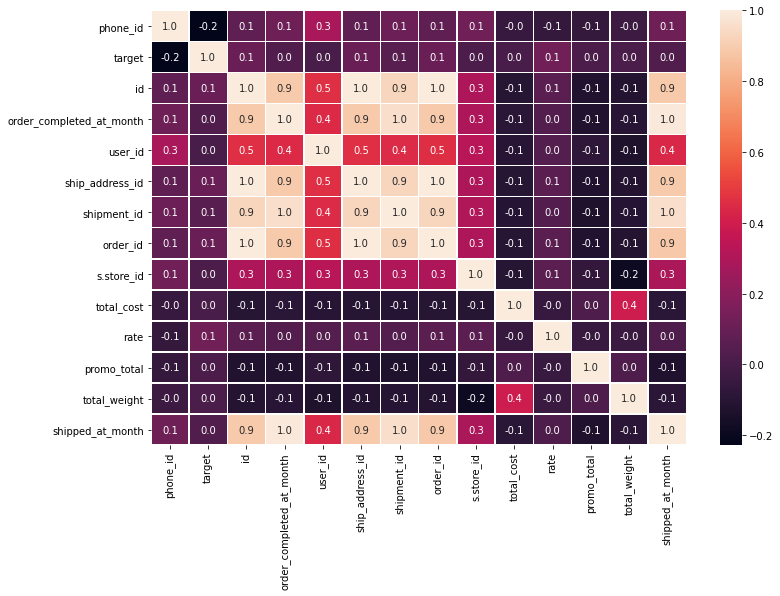

In [22]:
fig, ax = plt.subplots(figsize=(12,8)) 
sns.heatmap(train_all.corr(), annot=True, fmt=".1f", linewidths=.5,ax=ax)

In [23]:
from sklearn.preprocessing import   LabelEncoder

In [33]:
num_cols = ['order_completed_at_month', 'user_id', 'ship_address_id', 'shipment_id',
       'order_id',   's.store_id', 'total_cost', 'rate', 'promo_total',
       'total_weight','shipped_at_month']
categorical_features = [
    'retailer', 's.order_state', 'shipment_state',
       's.city_name',  'dw_kind', 'platform', 'os']

In [26]:
cat_train_all = train_all[categorical_features+['target']].copy()
for col in list(cat_train_all.columns)[:-1]:
    cat_train_all[col] =   LabelEncoder().fit_transform(cat_train_all[col].astype(str))

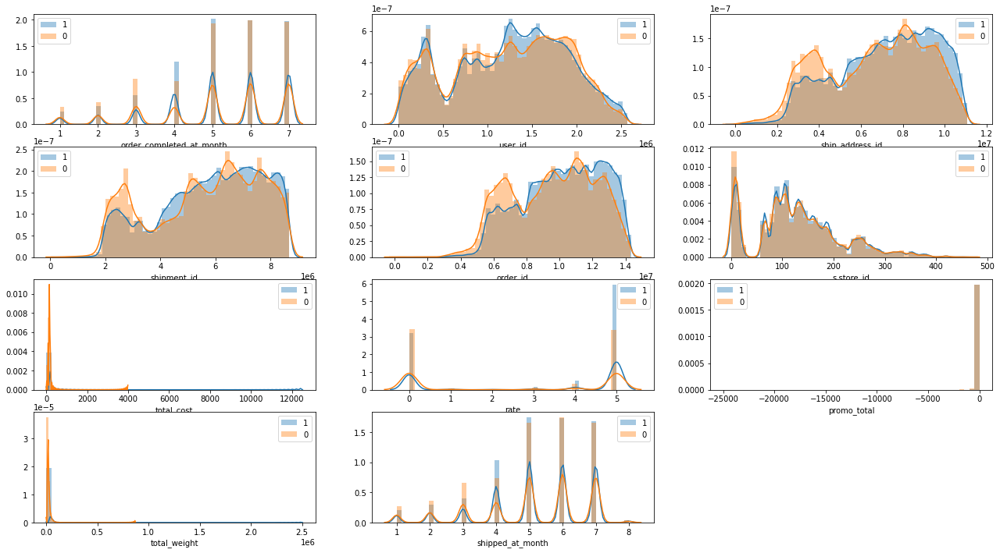

In [27]:

plt.figure(figsize = (22, 12))
for num_col,col in enumerate(num_cols):
    plt.subplot(4, 3, num_col+1)
    sns.distplot(train_all[train_all['target']==1][col],label='1')
    sns.distplot(train_all[train_all['target']==0][col],label='0')
    plt.legend()
    

<AxesSubplot:xlabel='shipped_at_month'>

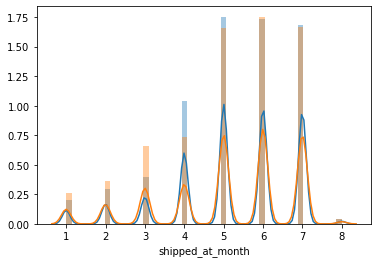

In [28]:
sns.distplot(train_all[train_all['target']==1]['shipped_at_month'],label='1')
sns.distplot(train_all[train_all['target']==0]['shipped_at_month'],label='0')

In [29]:
pd.crosstab(train_all['target'],train_all['shipped_at_month'])

shipped_at_month,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0
target,,,,,,,,
0.0,13298,18198,33013,36983,83199,87564,83284,1996
1.0,30942,45688,61867,160815,271426,268887,260150,5940


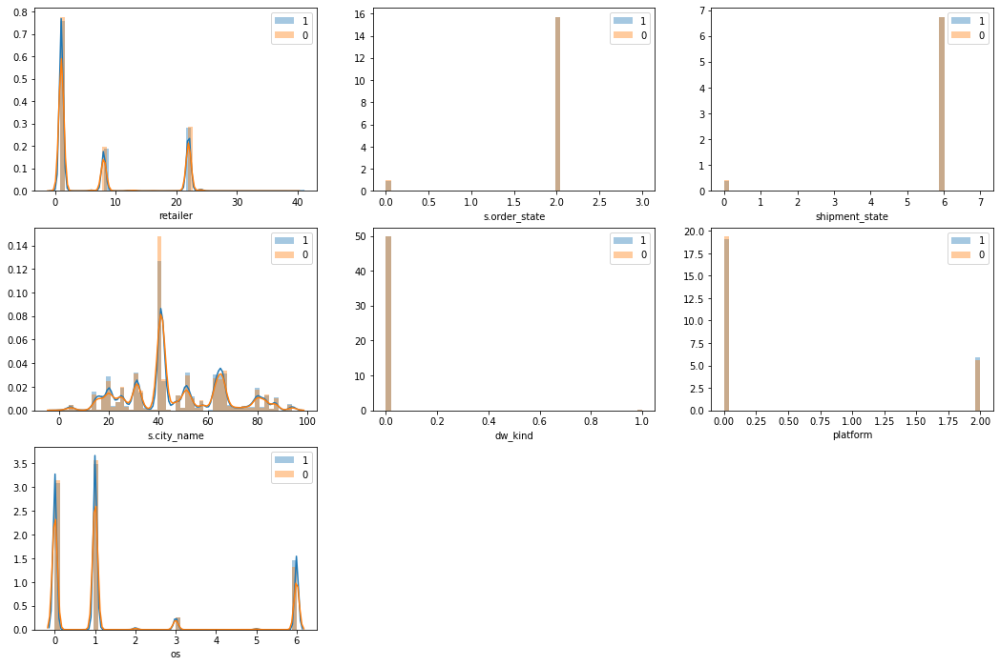

In [30]:
plt.figure(figsize = (18, 12))
for num_col,col in enumerate(categorical_features):
    plt.subplot(3, 3, num_col+1)
    sns.distplot(cat_train_all[cat_train_all['target']==1][col],label='1')
    sns.distplot(cat_train_all[cat_train_all['target']==0][col],label='0')
    plt.legend()

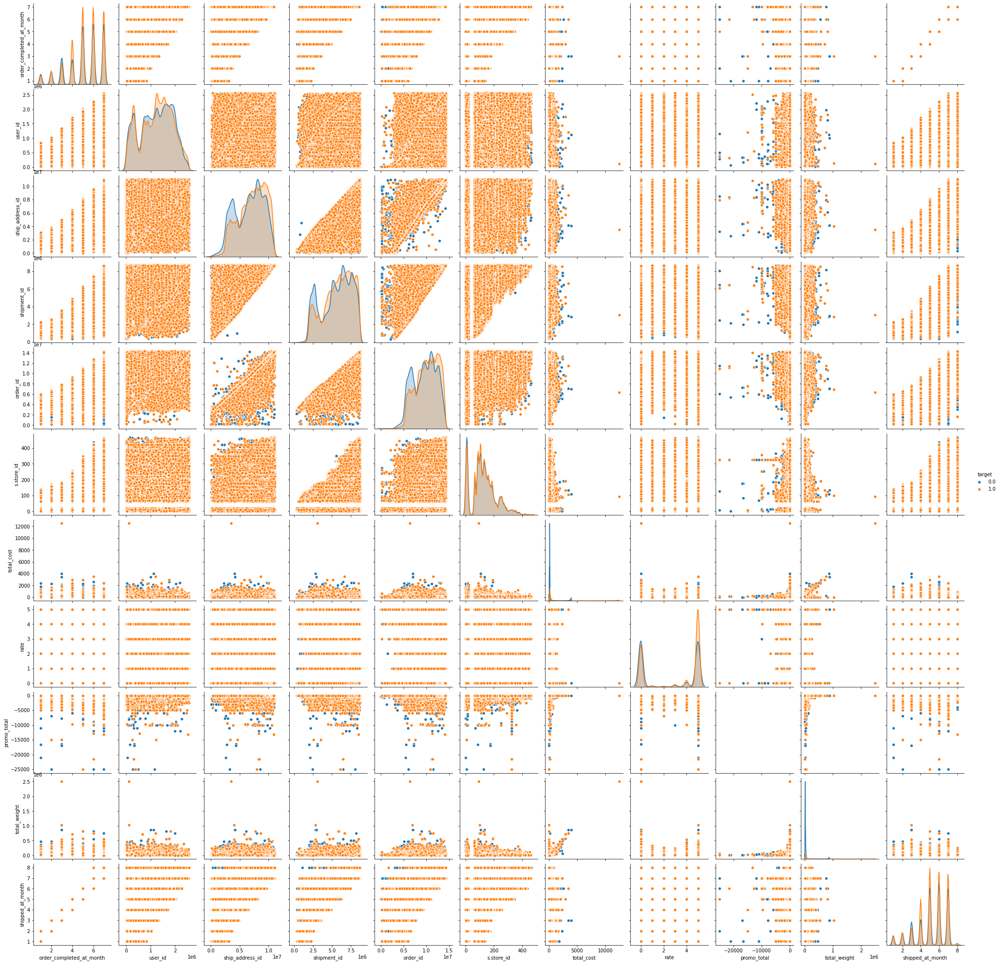

In [34]:
sns.pairplot(train_all[num_cols + ['target']], hue='target')

### Проверка sample submission

In [35]:
sample_submision = pd.read_csv('sample_submission.csv',sep=';')

In [36]:
sample_submision.head()

,Id,Predicted
0,19843,NaN
1,471287,NaN
2,342522,NaN
3,457799,NaN
4,233778,NaN


In [37]:
len(set(sample_submision['Id']))

214609

In [38]:
len(set(sample_submision['Id']).intersection(set(train_all['phone_id'])))

184805

In [39]:

len(set(sample_submision['Id']).intersection(set(train['phone_id'])))

188802